## Table of Contents
* [1. Introduction](#chapter1)
    * [1.1 Description](#section1_1)
    * [1.2 Main aims](#section1_2)
    * [1.3 Data description](#section1_3)
* [2. Preparation](#chapter2)
    * [2.1 Importing libs](#section2_1)
    * [2.2 Data import, research and preparation](#section2_2) 
* [3. Exploratory data analysis](#chapter3)
    * [3.1 Venue categories](#section3_1)
    * [3.2 Number of seats by categories](#section3_2)
    * [3.3 Chain vs non-chain venues](#section3_3)
    * [3.4 Chain venues by category](#section3_4)    
    * [3.5 Top-15 popular chains in Moscow](#section3_5)
    * [3.6 Venues by Moscow districts](#section3_6)
    * [3.7 Average ratings by category](#section3_7)
    * [3.8 Ratings by districts](#section3_8)    
    * [3.9 Venues by clusters](#section3_9)
    * [3.10 Top-15 streets by the number of venues](#section3_10)
    * [3.11 One venue streets](#section3_11)
    * [3.12 Median bill by districts](#section3_12)        
* [4. District for a new coffee shop ](#chapter4)
    * [4.1 Number of coffee shops and their location](#section4_1)
    * [4.2 Around the clock coffee shops](#section4_2)
    * [4.3 Coffee shops ratings](#section4_3)
    * [4.4 Average price for a cup of cappuccino](#section4_4)
    * [4.5 Recommendations](#section4_5)    

# 1. Introduction <a class="anchor" id="chapter1"></a>

### 1.1 Description <a class="anchor" id="section1_1"></a>

Analyzing the Moscow market and identifying noteworthy characteristics that could impact the decision to establish a new venue.

### 1.2 Main aims: <a class="anchor" id="section1_2"></a>

* Market research of Moscow's public catering industry;
* Evaluation of the best location for opening a new public catering venue.

### 1.3 Data description <a class="anchor" id="section1_3"></a>

There is a dataset with public catering venues in Moscow, compiled based on data from Yandex Maps and Yandex Business services for the summer of 2022. The information posted in the Yandex Business service could have been added by users or found in publicly available sources. It is purely for reference purposes.

File **`moscow_places.csv`:**
- `name` - the name of the venue;
- `address` - the address of the venue;
- `category` - the category of the venue, such as "cafe", "pizzeria", or "coffee shop";
- `hours` - information about the days and hours of operation;
- `lat` - the latitude of the geographic point where the venue is located;
- `lng` - the longitude of the geographic point where the venue is located;
- `rating` - the rating of the venue based on user ratings in Yandex Maps (the highest rating is 5.0);
- `price` - the price category of the venue, such as "medium", "below average", "above average", and so on;
`avg_bill` - a string that stores the average cost of an order in the form of a range, for example:
    * "Average bill: 1000-1500 ₽";
    * "Price of a cappuccino: 130-220 ₽";
    * "Price of a beer glass: 400-600 ₽", and so on;
- `middle_avg_bill` - a number with an evaluation of the average bill, which is indicated only for values ​​from the avg_bill column that begin with the substring "Average bill":
    * If the price range is specified in the string with two values, the median of these two values ​​will be entered into the column.
    * If one number is specified in the string, without a range, then this number will be entered into the column.
    * If there is no value or it does not start with the substring "Average bill", then nothing will be entered into the column.
- `middle_coffee_cup` - a number with an evaluation of the price of one cappuccino cup, which is indicated only for values ​​from the `avg_bill` column that begin with the substring "Price of one cappuccino cup":
    * If the price range is specified in the string with two values, the median of these two values ​​will be entered into the column.
    * If one number is specified in the string, without a range, then this number will be entered into the column.
    * If there is no value or it does not start with the substring "Price of one cappuccino cup", then nothing will be entered into the column.
- `chain` - a number expressed as `0` or `1`, which shows whether the venue is a chain (there may be errors for small chains):
* 0 - the venue is not a chain
* 1 - the venue is a chain
- `district` - the administrative district in which the venue is located, such as the Central Administrative District;
- `seats` - the number of seats.

# 2. Preparation <a class="anchor" id="chapter2"></a>

### 2.1 Importing libs <a class="anchor" id="section2_1"></a>

In [1]:
import pandas as pd
import numpy as np
import math as mth
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import datetime as dt
import scipy.stats as st
import plotly.express as px
from plotly import graph_objects as go
import warnings
import re
import folium
warnings.filterwarnings("ignore")
import json
import requests

### 2.2 Data import, research and preparation <a class="anchor" id="section2_2"></a>

In [2]:
# Reading dataset with venues
df = pd.read_csv('https://raw.githubusercontent.com/AntonMiniazev/YaP_projects/main/5.%20Public_catering_venus_analysis/datasets/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
git_url = "https://raw.githubusercontent.com/AntonMiniazev/YaP_projects/main/5.%20Public_catering_venus_analysis/datasets/admin_level_geomap.geojson"

# Send a GET request to the URL and store the response
response = requests.get(git_url)

# If the request is successful, load the JSON content into a variable
if response.status_code == 200:
    state_geo = json.loads(response.content)
else:
    print("Failed to load JSON data from GitHub.")

In [4]:
# Checking data types and explicit duplicates
print(df.info(),'\nDuplicated:' + str(df.duplicated().sum()))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None 
Duplicated:0


In [5]:
# Checking implicit duplicats by addresses and names by adding tech columns with lower caser values
df['name_lower'] = df['name'].str.lower()
df['address_lower'] = df['address'].str.lower()
df[['name_lower','address_lower']].duplicated().sum()

4

In [6]:
# Clearing out duplicates and tech columns
df = df.drop_duplicates(subset=['name_lower', 'address_lower'])
df.drop(columns = ['name_lower','address_lower'], inplace = True)

In [7]:
print('Total number of venues:',df['name'].nunique())

Total number of venues: 5613


**Brief conclusion:** The existing dataset contains 8406 rows and 5614 venues. Data formats are correctly specified, and no duplicates were found. There are a significant number of missing values in the data, which cannot be simply deleted for further analysis.

In [8]:
# Checking where avg_bill and middle_avg_bill do not intersect
df[df['middle_avg_bill'].isna() & df['avg_bill'].notnull()]['avg_bill'].unique()

array(['Цена чашки капучино:155–185 ₽', 'Цена бокала пива:250–350 ₽',
       'Цена бокала пива:120–350 ₽', 'Цена чашки капучино:150–190 ₽',
       'Цена чашки капучино:120–170 ₽', 'Цена чашки капучино:100–200 ₽',
       'Цена бокала пива:90–230 ₽', 'Цена чашки капучино:150–210 ₽',
       'Цена чашки капучино:80–160 ₽', 'Цена чашки капучино:100 ₽',
       'Цена чашки капучино:239–274 ₽', 'Цена чашки капучино:130–190 ₽',
       'Цена бокала пива:160–499 ₽', 'Цена чашки капучино:200–300 ₽',
       'Цена чашки капучино:150–180 ₽', 'Цена чашки капучино:119–179 ₽',
       'Цена чашки капучино:100–170 ₽', 'Цена чашки капучино:200–240 ₽',
       'Цена чашки капучино:150–200 ₽', 'Цена бокала пива:199–300 ₽',
       'Цена бокала пива:от 140 ₽', 'Цена бокала пива:от 149 ₽',
       'Цена бокала пива:150–450 ₽', 'Цена чашки капучино:150–240 ₽',
       'Цена чашки капучино:от 60 ₽', 'Цена чашки капучино:120–180 ₽',
       'Цена чашки капучино:179–249 ₽', 'Цена чашки капучино:75 ₽',
       'Цена чашк

Seems like the category of the venue strongly influences the order of filling in the analytics by the average bill.

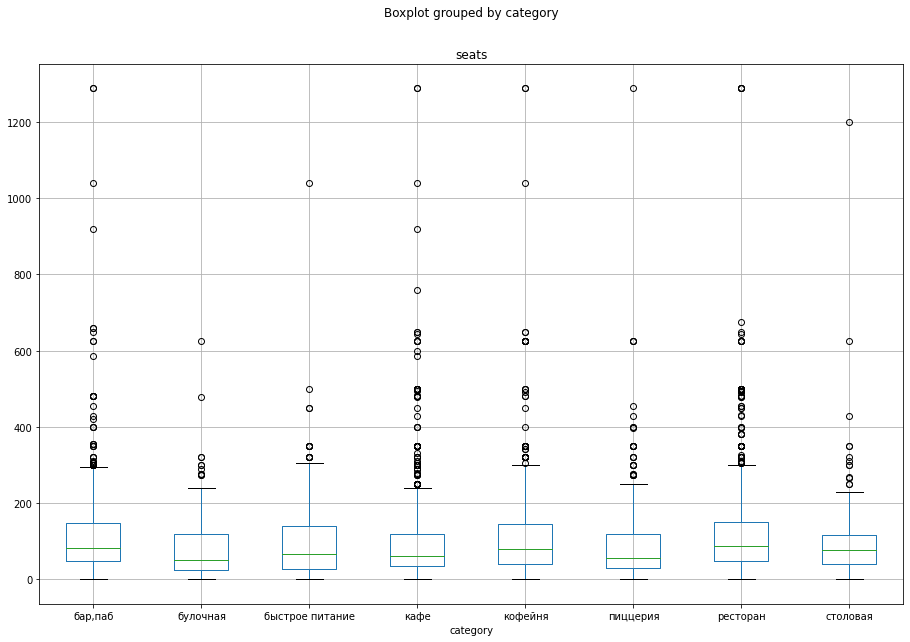

In [9]:
# Exploring distribution of the number of seat
df.boxplot(column='seats', by='category', figsize=(15, 10))
plt.show()

In [10]:
# Calculating 95th and 99th percentil of the number of seats
np.percentile(df[df['seats'].isnull() == False]['seats'],[95,99])

array([307., 625.])

In [11]:
# Checking the number of venues with 350+ seats
seats_350 = df[df['seats'] > 350]['name'].count()

In [12]:
print('Number of venues with 350+ seats:', seats_350,"\n% of the total number of venues:",round(seats_350/df['name'].nunique(),3)*100)

Number of venues with 350+ seats: 141 
% of the total number of venues: 2.5


In [13]:
# Clearing out the venues that have 350+ seats, slightly above 95th percentile
df = df.query('(seats <= 350) or (seats != seats)')

#### Extracting street name from column 'address'

In [14]:
# Checkig if all the addresses start with "Москва, "
addresses = df[['address']]
addresses['address'] = addresses.apply(lambda x: x.str[:8])
addresses['address'].unique()

array(['Москва, '], dtype=object)

In [15]:
# Using a function to extract all addresses before the comma. To separate addresses without commas, we will add a technical at the end of the string.
def street_extract(address):
    result = re.findall(r"^(.+?),", address)
    return result[0]

In [16]:
# Cutting off the part that starts with "Москва, " keeping only street names
df['street'] = df[['address']].apply(lambda x: x.str[8:])+','
df['street'] = df['street'].apply(lambda x: street_extract(x))

#### Adding a column 'is_24/7' with an indication of venues that work daily and around the clock.

In [17]:
# Checking the working schedule using the 'hours' column - values with "daily, 24/7" will be True, and the rest will be False.
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


#### Brief conclusion
* A large number of missing values were found in the data on average bill.
* All venues with 300+ seats were removed due to the nature of the outliers (2.34% of the total number of venues).
* Columns "street" and "is_24/7" were added with extracted street names and schedule category.

# 3. Exploratory data analysis <a class="anchor" id="chapter3"></a>

### 3.1 Venue categories <a class="anchor" id="section3_1"></a>

In [18]:
# Grouping dataset by categories
place_category = df.groupby('category')['name'].count().reset_index()
place_category

,category,name
0,"бар,паб",740
1,булочная,254
2,быстрое питание,599
3,кафе,2343
4,кофейня,1393
5,пиццерия,624
6,ресторан,1996
7,столовая,312


In [19]:
fig = go.Figure(data=[go.Pie(labels=place_category['category'],
                             values=place_category['name'])],
                      layout=go.Layout(title=go.layout.Title(text="Venues by categories")))
fig.show() 

In [20]:
fig = px.bar(place_category, 
             x='category', 
             y='name', 
             text='name',
             title='Venues by categories', width=800, height=400
            )
fig.update_layout(xaxis_title='Venues by categories',
                  yaxis_title='Number of venues',
                  xaxis={'categoryorder':'total descending'})
fig.show()

**Bries conclusion:** 
The two largest categories are cafes (2343 venues or 28.4%) and restaurants (1996 venues or 24.2%). Next in line are coffee shops (1393 venues or 16.9%).

### 3.2 Number of seats by categories <a class="anchor" id="section3_2"></a>

In [21]:
# Grouping dataset by seats number
place_seats = df.groupby('category')['seats'].median().round(2).reset_index()
place_seats

,category,seats
0,"бар,паб",80.0
1,булочная,49.5
2,быстрое питание,64.0
3,кафе,60.0
4,кофейня,75.0
5,пиццерия,51.0
6,ресторан,83.0
7,столовая,75.0


In [22]:
fig = px.bar(place_seats, 
             x='category', 
             y='seats', 
             text='seats',
             title='Avg. number of venues by category', width=800, height=400
            )
fig.update_layout(xaxis_title='Venue category',
                  yaxis_title='Avg. number of seats',
                  xaxis={'categoryorder':'total descending'})
fig.show()

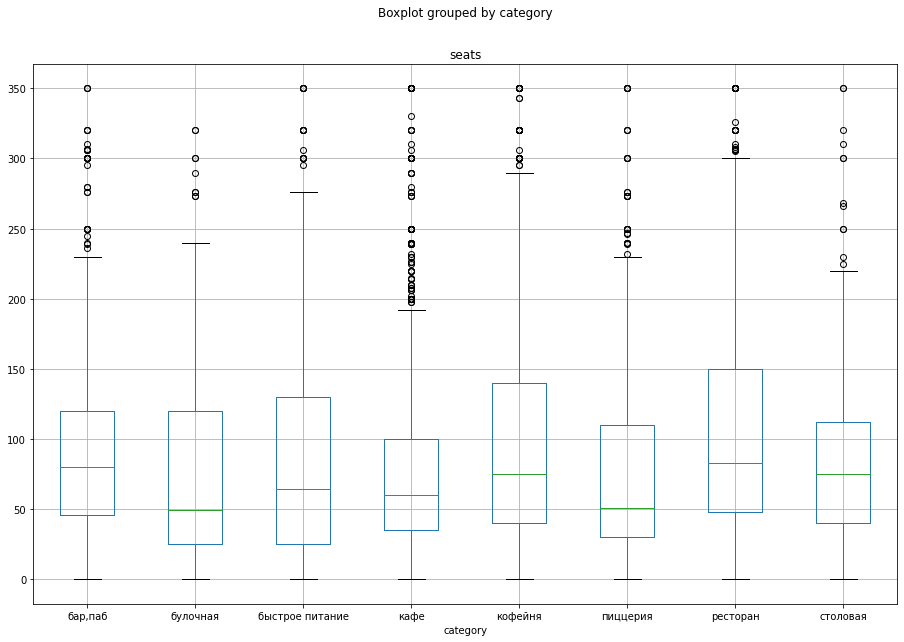

In [23]:
# Before we excluded outliners, checking the number of seats after that
df.boxplot(column='seats', by='category', figsize=(15, 10))
plt.show()

**Bries conclusion:**
On average, restaurants, bars, and pubs have over 80 seats. Pizzerias and bakeries have the least amount of seats on average - around 50. It is likely that the former are focused on delivery, while the latter are focused on take-out.

### 3.3 Chain vs non-chain venues <a class="anchor" id="section3_3"></a>

In [24]:
# Grouping dataset by chain/non-chain attribute
chains_number = df['chain'].value_counts().reset_index()
chains_number

,index,chain
0,0,5117
1,1,3144


In [25]:
fig = go.Figure(data=[go.Pie(labels=['non-chain', 'chain'], 
                             values=chains_number['chain'])], 
                layout=go.Layout(title=go.layout.Title(text="Chain to non-chain venues ratio")))
fig.show()

**Bries conclusion:** In Moscow, about 62% of venues are independent (non-chain).

### 3.4 Chain venues by category <a class="anchor" id="section3_4"></a>

In [26]:
# Grouping venues by categories and chain/non-chain attribute
chain_category = df.groupby(['category','chain'])['name'].count().reset_index()
chain_category['%'] = (100 * chain_category['name'] / chain_category.groupby(['category'])['name'].transform('sum')).round(2)

# Changing data type of 'chain' column for correct color setting
chain_category['chain'] = chain_category['chain'].astype(object)
chain_category

,category,chain,name,%
0,"бар,паб",0,575,77.70
1,"бар,паб",1,165,22.30
2,булочная,0,99,38.98
3,булочная,1,155,61.02
4,быстрое питание,0,368,61.44
5,быстрое питание,1,231,38.56
6,кафе,0,1577,67.31
7,кафе,1,766,32.69
8,кофейня,0,685,49.17
9,кофейня,1,708,50.83


In [27]:
chain_category = chain_category.sort_values(by='name')
fig = px.bar(chain_category,
             x = 'name', 
             y = 'category',
             text='name',
             color = 'chain'
            )
fig.update_layout(title = 'Relation of venues by categories, units',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Venue category')
fig.show()

In [28]:
chain_category = chain_category.sort_values(by='%')
fig = px.bar(chain_category,
             x = '%', 
             y = 'category',
             text='%',
             color = 'chain'
            )
fig.update_layout(title = 'Relation of venues by categories, %',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Venue category')
fig.show()

**Bries conclusion:**
* In absolute terms, cafes (766 out of 2343) and restaurants (709 out of 1996) have the most chain venues by category.
* In relative terms, bakeries (61.02%), pizzerias (51.92%), and coffee shops (50.83%) have the highest proportion of chain venues.

### 3.5 Top-15 popular chains in Moscow <a class="anchor" id="section3_5"></a>

In [29]:
# Extracting top-15 venues from dataset
top_15_chains = df[df['chain'] == 1]
top_15_chains = top_15_chains.groupby('name').agg({ 'category' : pd.Series.mode, 'district' : 'count'})
top_15_chains = top_15_chains.rename(columns={'district':'count'})
top_15_chains = top_15_chains.sort_values('count', ascending = False).reset_index().head(15)
top_15_chains

,name,category,count
0,Шоколадница,кофейня,117
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,73
3,One Price Coffee,кофейня,70
4,Яндекс Лавка,ресторан,67
5,Cofix,кофейня,64
6,Prime,ресторан,48
7,Хинкальная,кафе,44
8,КОФЕПОРТ,кофейня,42
9,Теремок,ресторан,38


In [30]:
fig = px.bar(top_15_chains,
             x = 'count', 
             y = 'name',
             text='count'
            )
fig.update_layout(title = 'Top-15 chain venues in Moscow',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Chain')
fig.show()

In [31]:
# Grouping top-15 by categories
top_15_categories = top_15_chains.groupby(['category'])['count'].sum().reset_index()
top_15_categories

,category,count
0,булочная,32
1,кафе,144
2,кофейня,325
3,пиццерия,149
4,ресторан,153


In [32]:
fig = px.bar(top_15_categories,
             x = 'count', 
             y = 'category',
             text='count',
             color = 'category'
            )
fig.update_layout(title = 'Top-15 chain venues in Moscow by categories',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Category',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

In [33]:
# Extracting top-15 into antoher dataframe
top_15_list = top_15_chains['name'].unique()
df_top_15 = df.query('name in @top_15_list')
df_top_15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 803 entries, 13 to 7981
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               803 non-null    object 
 1   category           803 non-null    object 
 2   address            803 non-null    object 
 3   district           803 non-null    object 
 4   hours              788 non-null    object 
 5   lat                803 non-null    float64
 6   lng                803 non-null    float64
 7   rating             803 non-null    float64
 8   price              237 non-null    object 
 9   avg_bill           385 non-null    object 
 10  middle_avg_bill    249 non-null    float64
 11  middle_coffee_cup  136 non-null    float64
 12  chain              803 non-null    int64  
 13  seats              516 non-null    float64
 14  street             803 non-null    object 
 15  is_24/7            788 non-null    object 
dtypes: float64(6), int64(1),

In [34]:
# Grouping top-15 by districts
district_top_15 = df_top_15.groupby(['category','district'])['name'].count().reset_index()
district_top_15.head()

,category,district,name
0,"бар,паб",Восточный административный округ,2
1,"бар,паб",Центральный административный округ,1
2,"бар,паб",Юго-Западный административный округ,1
3,булочная,Восточный административный округ,1
4,булочная,Западный административный округ,5


In [35]:
fig = px.bar(district_top_15,
             x = 'name', 
             y = 'district',
             color = 'category'
            )
fig.update_layout(title = 'Top-15 chain venues in Moscow',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Chain',  
                   yaxis={'categoryorder':'total ascending'},
                   legend=dict(title="Categories"))
fig.show()

**Bries conclusion:**
* The top 15 chains have 803 venues;
* The most popular venues are Shokoladnitsa (117), Domino's Pizza (76), and Dodo Pizza (73);
* Among the top 15, the coffee shop category is the most represented. Pizzerias, cafes, and restaurants have around 150 venues in each category and noticeably lag behind bakeries with 32 venues in the top 15 chains;
* The largest number of top 15 venues is located in the Central Administrative District (CAD), where coffee shops are the most popular. Interestingly, pizzerias in the CAD are not as popular as in other districts. Overall, the three most popular categories are restaurants, coffee shops, and pizzerias across all districts.

### 3.6 Venues by Moscow districts <a class="anchor" id="section3_6"></a>

In [36]:
districts_places = df.groupby(['category','district'])['name'].count().reset_index()
districts_places.head()

,category,district,name
0,"бар,паб",Восточный административный округ,45
1,"бар,паб",Западный административный округ,46
2,"бар,паб",Северный административный округ,66
3,"бар,паб",Северо-Восточный административный округ,62
4,"бар,паб",Северо-Западный административный округ,23


In [37]:
fig = px.bar(districts_places,
             x = 'name', 
             y = 'district',
             color = 'category'
            )
fig.update_layout(title = 'Chain venues in Moscow by districts',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Chain',  
                   yaxis={'categoryorder':'total ascending'},
                   legend=dict(title="Categories"))
fig.show()

**Bries conclusion:**
* Compared to the distribution of venues in the top 15, the cafe category shows a significant presence in all districts. 
* Additionally, bars and pubs are starting to stand out noticeably in the Central Administrative District and to a lesser extent in other districts, where they were almost absent among the top 15 chains.

### 3.7 Average ratings by category <a class="anchor" id="section3_7"></a>

In [38]:
rating_category = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [39]:
fig = px.bar(rating_category,
             x = 'rating', 
             y = 'category',
             text = 'rating',
             color = 'category'
            )
fig.update_layout(title = 'Venues ratings by categories',
                   xaxis_title = 'Avg. rating',
                   yaxis_title = 'Category',  
                   yaxis={'categoryorder':'total ascending'},  
                   legend=dict(title="Categories"),
                   showlegend=False
                 )
fig.update_xaxes(range=[3.5, 4.5])
fig.show()

**Bries conclusion:**
Bars and pubs on average receive higher ratings than other categories. The categories of cafes and fast food are noticeably lagging behind.

### 3.8 Ratings by districts <a class="anchor" id="section3_8"></a>

In [40]:
# Grouping dataset by districts and ratings
ratings_districts = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
ratings_districts

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [41]:
# Importing map and choropleth
from folium import Map, Choropleth

# moscow_lat - Moscow center width, moscow_lng - Moscow center longtitude
moscow_lat, moscow_lng = 55.751244, 37.618423

# Creating Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Creating choropleth
Choropleth(
    geo_data=state_geo,
    data=ratings_districts,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Avg. venue ratings by districts',
).add_to(m)

# Loading map
m

**Bries conclusion:**
The highest rating is for venues in the Central Administrative District - 4.38, and the lowest is in the Southeastern Administrative District - 4.1.

### 3.9 Venues by clusters <a class="anchor" id="section3_9"></a>

In [42]:
# Importing map and marker
from folium import Map, Marker
# Importing clusters
from folium.plugins import MarkerCluster

# Creating Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# Creating empty cluster
marker_cluster = MarkerCluster().add_to(m)

# Function to take a line from dataframe,
# create a marker in the current place and add them to cluster marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# applying create_clusters() function to dataframe
df.apply(create_clusters, axis=1)

# Loading map
m

**Bries conclusion:**

### 3.10 Top-15 streets by the number of venues <a class="anchor" id="section3_10"></a>

In [43]:
# Calculating the number of venues on each street
top15_streets = df[df['street'].notnull()]
top15_streets = top15_streets['street'].value_counts().reset_index().head(15)
top15_streets

,index,street
0,проспект Мира,183
1,Профсоюзная улица,122
2,Ленинский проспект,101
3,проспект Вернадского,97
4,Дмитровское шоссе,88
5,Каширское шоссе,77
6,Варшавское шоссе,73
7,Ленинградский проспект,72
8,Ленинградское шоссе,70
9,МКАД,65


In [44]:
# Extracting top-15 into another dataset
streets_top_15_list = top15_streets['index'].unique()
df_top_15_streets = df.query('street in @streets_top_15_list')
df_top_15_streets.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1209 entries, 8 to 8404
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1209 non-null   object 
 1   category           1209 non-null   object 
 2   address            1209 non-null   object 
 3   district           1209 non-null   object 
 4   hours              1133 non-null   object 
 5   lat                1209 non-null   float64
 6   lng                1209 non-null   float64
 7   rating             1209 non-null   float64
 8   price              456 non-null    object 
 9   avg_bill           530 non-null    object 
 10  middle_avg_bill    447 non-null    float64
 11  middle_coffee_cup  68 non-null     float64
 12  chain              1209 non-null   int64  
 13  seats              718 non-null    float64
 14  street             1209 non-null   object 
 15  is_24/7            1133 non-null   object 
dtypes: float64(6), int64(1),

In [45]:
top15_streets_category = df_top_15_streets.groupby(['street', 'category'])['name'].count().reset_index().sort_values('name', ascending=False)
top15_streets_category

,street,category,name
101,проспект Мира,кафе,53
104,проспект Мира,ресторан,45
71,МКАД,кафе,45
102,проспект Мира,кофейня,36
78,Профсоюзная улица,кафе,35
...,...,...,...
7,Алтуфьевское шоссе,столовая,1
1,Алтуфьевское шоссе,булочная,1
74,МКАД,столовая,1
69,МКАД,"бар,паб",1


In [46]:
fig = px.bar(top15_streets_category,
             x = 'name', 
             y = 'street',
             color = 'category'
            )
fig.update_layout(title = 'Venue categories on top-15 streets',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Street',  
                   yaxis={'categoryorder':'total ascending'},
                   legend=dict(title="Categories")
                 )
fig.show()

**Bries conclusion:**
* The most popular street is Prospekt Mira, which has the largest number of cafes and restaurants.
* The second most popular is Profsoyuznaya Street, with popular categories also being cafes and restaurants.

### 3.11 One venue streets <a class="anchor" id="section3_11"></a>

In [47]:
# Grouping one venue streets
alone_place = df['street'].value_counts().reset_index()
alone_place = alone_place[alone_place['street'] == 1]

In [48]:
# Extracting top-15 into anonther dataset
alone_list = alone_place['index'].unique()
df_alone = df.query('street in @alone_list')
df_alone.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 460 entries, 15 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               460 non-null    object 
 1   category           460 non-null    object 
 2   address            460 non-null    object 
 3   district           460 non-null    object 
 4   hours              433 non-null    object 
 5   lat                460 non-null    float64
 6   lng                460 non-null    float64
 7   rating             460 non-null    float64
 8   price              182 non-null    object 
 9   avg_bill           194 non-null    object 
 10  middle_avg_bill    165 non-null    float64
 11  middle_coffee_cup  24 non-null     float64
 12  chain              460 non-null    int64  
 13  seats              156 non-null    float64
 14  street             460 non-null    object 
 15  is_24/7            433 non-null    object 
dtypes: float64(6), int64(1),

In [49]:
alone_category = df_alone.groupby(['category'])['name'].count().reset_index().sort_values('name', ascending=False)
alone_category

,category,name
3,кафе,160
6,ресторан,94
4,кофейня,85
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [50]:
fig = px.bar(alone_category,
             x = 'name', 
             y = 'category',
             color = 'category',
             text = 'name'
            )
fig.update_layout(title = 'Venue categories on one venue streets',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'Category',  
                   yaxis={'categoryorder':'total ascending'},
                   showlegend=False)
fig.show()

**Bries conclusion:**
* More often than not, cafes are located on streets with only one venue. 
* There are a total of 460 streets with only one venue.

### 3.12 Median bill by districts <a class="anchor" id="section3_12"></a>

In [51]:
# Calculating median bill value
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,444.5
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [52]:
# Creating Moscow map
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Creating choropleth
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Avg. bill by district',
).add_to(m_2)

# Loading map
m_2

**Bries conclusion:**
* The most expensive venues are located in the Central Administrative District and Western Administrative District.
* The lowest bill amount is found in venues in the Southeastern Administrative District.

### Overall conclusion on data analysis
* The most popular venues in Moscow are cafes (2343 places or 28.4% of the total) and restaurants (1996 places or 24.2% of the total);
* Restaurants, bars, and pubs have the most seating capacity;
* There are more non-chain venues in Moscow (62% compared to 38%);
* Among chain venues, cafes and restaurants are the most common, which is explained by the popularity of this category. When looking at relative indicators, chain venues are more common among bakeries, pizzerias, and coffee shops;
* Around 10% of venues belong to the top 15 chains, which have 803 locations in Moscow. The most popular among them are Shokoladnitsa, Domino's Pizza, and Dodo Pizza;
* Bars and pubs receive the highest ratings, while fast food venues receive the lowest ratings;
* The Central Administrative District (CAO) is represented by venues with the highest ratings, while the Southeastern Administrative District (SAD) has the lowest ratings;
* One of the largest streets in Moscow, Prospekt Mira, predictably has the largest number of venues;
* Cafes are most often opened on streets with only one venue, and there are 460 such streets;
* The highest average check is in the CAO and ZAO. Taking into account ratings, if you want to open high-quality venues, these districts should be considered. The lowest average check is in the SAD. Taking into account low ratings, there may be a shortage of venues with a balance of quality and price in this district.

# 4. District for a new coffee shop  <a class="anchor" id="chapter4"></a>

### 4.1 Number of coffee shops and their location <a class="anchor" id="section4_1"></a>

In [53]:
# Extracting coffee shops from dataset
df_coffee = df[df['category'] == 'кофейня']
print('Number of coffee shops:', df_coffee['name'].count())

Number of coffee shops: 1393


In [54]:
# Grouping coffee shops by districts
coffee_districts = df_coffee.groupby('district')['name'].count().reset_index()
coffee_districts

,district,name
0,Восточный административный округ,104
1,Западный административный округ,146
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,422
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,95
8,Южный административный округ,130


In [55]:
fig = px.bar(coffee_districts,
             x = 'name', 
             y = 'district',
             color = 'district',
             text = 'name'
            )
fig.update_layout(title = 'Number of coffee shops by districts',
                   xaxis_title = 'Number of venues',
                   yaxis_title = 'District',  
                   yaxis={'categoryorder':'total ascending'},
                   showlegend=False)
fig.show()

In [56]:
# Placing coffee shops on Moscow map
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m_3)

# Function for placing markers
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
df_coffee.apply(create_clusters, axis=1)
m_3

**Brief conclusion:**
The largest number of coffee shops is in the Central Administrative District - 422 venues. There are also many coffee shops in the northern part of the city.

### 4.2 Around the clock coffee shops <a class="anchor" id="section4_2"></a>

In [57]:
# Extracting 24/7 coffee shops from dataset
coffee_24 = df_coffee[df_coffee['is_24/7'] == True]
print('Number of 24-hour coffee shops:', coffee_24['name'].count())

Number of 24-hour coffee shops: 59


In [58]:
# Placing 24/7 coffee shops on Moscow map
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m_4)

coffee_24.apply(create_clusters, axis=1)
m_4

**Brief conclusion:**
24-hour coffee shops are most commonly found in the city center.

### 4.3 Coffee shops ratings <a class="anchor" id="section4_3"></a>

In [59]:
# Grouping coffee shops by districts and ratings
coffee_rating = df_coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.29
0,Восточный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [60]:
# Creating Moscow map
m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Creating choropleth
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Avg. rating of coffee shops by districts',
).add_to(m_5)

# Loading map
m_5

**Brief conclusion:**
In Central Administrative District and Northwestern Administrative District, coffee shops have the highest average rating of 4.34 and 4.33, respectively.

### 4.4 Average price for a cup of cappuccino <a class="anchor" id="section4_4"></a>

In [61]:
# Grouping coffee shops by district and median price of coffee
avg_coffee = df_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').round(2).sort_values('middle_coffee_cup', ascending=False)
display(avg_coffee)
print('Average price of a cup of cappuccino:', round(avg_coffee['middle_coffee_cup'].mean(),2))

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Average price of a cup of cappuccino: 166.0


In [62]:
# Creating Moscow map
m_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Creating choropleth
Choropleth(
    geo_data=state_geo,
    data=avg_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Average price of a cup of cappuccino by districts',
).add_to(m_6)

# Loading map
m_6

**Brief conclusion:**
In the Central Administrativ District, the Western Administrative District, and the Southwest Administrative District, a cup of cappuccino can be bought for around 190-200 rubles. The cheapest districts are Southeast Administrative District and Eastern Administrative District, where a cup costs less than 150 rubles.

### 4.5 Recommendations <a class="anchor" id="section4_5"></a>

Despite the high concentration of coffee shops in the center, the most attractive district for opening venues remains the Central Administrative District for several reasons:

* For a coffee shop, high foot traffic is important, which is guaranteed almost anywhere in the Central Administrative District;
* Coffee shops are in demand in business and tourist areas, not residential areas, where family venues are more popular;
* High average check and the cost of a cappuccino provide an opportunity to open a coffee shop with lower prices and attract customers due to this, as well as keep prices at the level of competitors and increase sales margins;
* The two main problems of opening a coffee shop in the Central Administrative District are high competition and the cost of renting premises. It is necessary to compete both with quality (coffee shops with high ratings in Moscow are precisely located in the CAD) and with the number of venues themselves.